## Step 1: Install necessary libraries

In [184]:
!pip install pandas geopandas matplotlib plotly folium


[notice] A new release of pip is available: 23.3.1 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


## Step 2: Import Libraries

In [185]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import plotly.express as px
import folium
from IPython.display import display
from branca.colormap import LinearColormap
import seaborn as sns


## Step 3: Load the Dataset
#### Dataset Overview - Global Country Information Dataset 2023
A comprehensive dataset providing an extensive range of country-specific data for the year 2023. 
This dataset empowers in-depth analysis, enabling cross-country comparisons and data-driven insights.

**Source:** [Kaggle](https://www.kaggle.com/datasets/nelgiriyewithana/countries-of-the-world-2023/data)



In [186]:
# Load the dataset
data = pd.read_csv('/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/data/world-data-2023.csv')

# Display the first few rows to understand the structure
data

,Country,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Afghanistan,60,AF,58.10%,"652,230","323,000",32.49,93.0,Kabul,"8,672",...,78.40%,0.28,"38,041,754",48.90%,9.30%,71.40%,11.12%,"9,797,273",33.939110,67.709953
1,Albania,105,AL,43.10%,"28,748","9,000",11.78,355.0,Tirana,"4,536",...,56.90%,1.20,"2,854,191",55.70%,18.60%,36.60%,12.33%,"1,747,593",41.153332,20.168331
2,Algeria,18,DZ,17.40%,"2,381,741","317,000",24.28,213.0,Algiers,"150,006",...,28.10%,1.72,"43,053,054",41.20%,37.20%,66.10%,11.70%,"31,510,100",28.033886,1.659626
3,Andorra,164,AD,40.00%,468,NaN,7.20,376.0,Andorra la Vella,469,...,36.40%,3.33,"77,142",NaN,NaN,NaN,NaN,"67,873",42.506285,1.521801
4,Angola,26,AO,47.50%,"1,246,700","117,000",40.73,244.0,Luanda,"34,693",...,33.40%,0.21,"31,825,295",77.50%,9.20%,49.10%,6.89%,"21,061,025",-11.202692,17.873887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Venezuela,32,VE,24.50%,"912,050","343,000",17.88,58.0,Caracas,"164,175",...,45.80%,1.92,"28,515,829",59.70%,NaN,73.30%,8.80%,"25,162,368",6.423750,-66.589730
191,Vietnam,314,VN,39.30%,"331,210","522,000",16.75,84.0,Hanoi,"192,668",...,43.50%,0.82,"96,462,106",77.40%,19.10%,37.60%,2.01%,"35,332,140",14.058324,108.277199
192,Yemen,56,YE,44.60%,"527,968","40,000",30.45,967.0,Sanaa,"10,609",...,81.00%,0.31,"29,161,922",38.00%,NaN,26.60%,12.91%,"10,869,523",15.552727,48.516388
193,Zambia,25,ZM,32.10%,"752,618","16,000",36.19,260.0,Lusaka,"5,141",...,27.50%,1.19,"17,861,030",74.60%,16.20%,15.60%,11.43%,"7,871,713",-13.133897,27.849332


## Step 4: Exploring Data

In [187]:
data.columns

Index(['Country', 'Density\n(P/Km2)', 'Abbreviation', 'Agricultural Land( %)',
       'Land Area(Km2)', 'Armed Forces size', 'Birth Rate', 'Calling Code',
       'Capital/Major City', 'Co2-Emissions', 'CPI', 'CPI Change (%)',
       'Currency-Code', 'Fertility Rate', 'Forested Area (%)',
       'Gasoline Price', 'GDP', 'Gross primary education enrollment (%)',
       'Gross tertiary education enrollment (%)', 'Infant mortality',
       'Largest city', 'Life expectancy', 'Maternal mortality ratio',
       'Minimum wage', 'Official language', 'Out of pocket health expenditure',
       'Physicians per thousand', 'Population',
       'Population: Labor force participation (%)', 'Tax revenue (%)',
       'Total tax rate', 'Unemployment rate', 'Urban_population', 'Latitude',
       'Longitude'],
      dtype='object')

In [188]:
data.head(5)

,Country,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Afghanistan,60,AF,58.10%,"652,230","323,000",32.49,93.0,Kabul,"8,672",...,78.40%,0.28,"38,041,754",48.90%,9.30%,71.40%,11.12%,"9,797,273",33.939110,67.709953
1,Albania,105,AL,43.10%,"28,748","9,000",11.78,355.0,Tirana,"4,536",...,56.90%,1.20,"2,854,191",55.70%,18.60%,36.60%,12.33%,"1,747,593",41.153332,20.168331
2,Algeria,18,DZ,17.40%,"2,381,741","317,000",24.28,213.0,Algiers,"150,006",...,28.10%,1.72,"43,053,054",41.20%,37.20%,66.10%,11.70%,"31,510,100",28.033886,1.659626
3,Andorra,164,AD,40.00%,468,NaN,7.20,376.0,Andorra la Vella,469,...,36.40%,3.33,"77,142",NaN,NaN,NaN,NaN,"67,873",42.506285,1.521801
4,Angola,26,AO,47.50%,"1,246,700","117,000",40.73,244.0,Luanda,"34,693",...,33.40%,0.21,"31,825,295",77.50%,9.20%,49.10%,6.89%,"21,061,025",-11.202692,17.873887


## Step 5: Cleaning the Data

In [189]:
# Identify numeric columns
numeric_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Fill missing values in numeric columns with the mean
for col in numeric_columns:
    data[col].fillna(data[col].mean(), inplace=True)

data

# Check if there are any missing values left
print(data.isnull().sum())

Country                                       0
Density\n(P/Km2)                              0
Abbreviation                                  7
Agricultural Land( %)                         7
Land Area(Km2)                                1
Armed Forces size                            24
Birth Rate                                    0
Calling Code                                  0
Capital/Major City                            3
Co2-Emissions                                 7
CPI                                          17
CPI Change (%)                               16
Currency-Code                                15
Fertility Rate                                0
Forested Area (%)                             7
Gasoline Price                               20
GDP                                           2
Gross primary education enrollment (%)        7
Gross tertiary education enrollment (%)      12
Infant mortality                              0
Largest city                            

In [190]:
# Create a GeoDataFrame using the latitude and longitude from your CSV
geometry = [Point(xy) for xy in zip(data['Longitude'], data['Latitude'])]
gdf = gpd.GeoDataFrame(data, geometry=geometry)

# Set the CRS (Coordinate Reference System) to WGS84, which is common for GPS coordinates
gdf.set_crs(epsg=4326, inplace=True)

# Display the GeoDataFrame
gdf

,Country,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude,geometry
0,Afghanistan,60,AF,58.10%,"652,230","323,000",32.49,93.0,Kabul,"8,672",...,0.28,"38,041,754",48.90%,9.30%,71.40%,11.12%,"9,797,273",33.939110,67.709953,POINT (67.70995 33.93911)
1,Albania,105,AL,43.10%,"28,748","9,000",11.78,355.0,Tirana,"4,536",...,1.20,"2,854,191",55.70%,18.60%,36.60%,12.33%,"1,747,593",41.153332,20.168331,POINT (20.16833 41.15333)
2,Algeria,18,DZ,17.40%,"2,381,741","317,000",24.28,213.0,Algiers,"150,006",...,1.72,"43,053,054",41.20%,37.20%,66.10%,11.70%,"31,510,100",28.033886,1.659626,POINT (1.65963 28.03389)
3,Andorra,164,AD,40.00%,468,NaN,7.20,376.0,Andorra la Vella,469,...,3.33,"77,142",NaN,NaN,NaN,NaN,"67,873",42.506285,1.521801,POINT (1.5218 42.50628)
4,Angola,26,AO,47.50%,"1,246,700","117,000",40.73,244.0,Luanda,"34,693",...,0.21,"31,825,295",77.50%,9.20%,49.10%,6.89%,"21,061,025",-11.202692,17.873887,POINT (17.87389 -11.20269)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Venezuela,32,VE,24.50%,"912,050","343,000",17.88,58.0,Caracas,"164,175",...,1.92,"28,515,829",59.70%,NaN,73.30%,8.80%,"25,162,368",6.423750,-66.589730,POINT (-66.58973 6.42375)
191,Vietnam,314,VN,39.30%,"331,210","522,000",16.75,84.0,Hanoi,"192,668",...,0.82,"96,462,106",77.40%,19.10%,37.60%,2.01%,"35,332,140",14.058324,108.277199,POINT (108.2772 14.05832)
192,Yemen,56,YE,44.60%,"527,968","40,000",30.45,967.0,Sanaa,"10,609",...,0.31,"29,161,922",38.00%,NaN,26.60%,12.91%,"10,869,523",15.552727,48.516388,POINT (48.51639 15.55273)
193,Zambia,25,ZM,32.10%,"752,618","16,000",36.19,260.0,Lusaka,"5,141",...,1.19,"17,861,030",74.60%,16.20%,15.60%,11.43%,"7,871,713",-13.133897,27.849332,POINT (27.84933 -13.1339)


## Step 6: Loading the Shapefile

In [191]:
# Load the shapefile into a GeoDataFrame
shapefile_path = '/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/data/Book Data/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp'
world = gpd.read_file(shapefile_path)

# Display the first few rows to check the data
world

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,...,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry
0,Admin-0 country,1,6,Fiji,FJI,0,2,Sovereign country,1,Fiji,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ..."
1,Admin-0 country,1,3,United Republic of Tanzania,TZA,0,2,Sovereign country,1,United Republic of Tanzania,...,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3..."
2,Admin-0 country,1,7,Western Sahara,SAH,0,2,Indeterminate,1,Western Sahara,...,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Admin-0 country,1,2,Canada,CAN,0,2,Sovereign country,1,Canada,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -122.97421 49.0025..."
4,Admin-0 country,1,2,United States of America,US1,1,2,Country,1,United States of America,...,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((-122.84 49, -120 49, -117.0312..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,Admin-0 country,1,5,Republic of Serbia,SRB,0,2,Sovereign country,1,Republic of Serbia,...,None,None,None,None,None,None,None,None,None,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,Admin-0 country,1,6,Montenegro,MNE,0,2,Sovereign country,1,Montenegro,...,None,None,None,None,None,None,None,None,None,"POLYGON ((20.0707 42.58863, 19.80161 42.50009,..."
174,Admin-0 country,1,6,Kosovo,KOS,0,2,Disputed,1,Kosovo,...,Admin-0 country,Unrecognized,Admin-0 country,Unrecognized,Admin-0 country,Admin-0 country,Admin-0 country,Admin-0 country,Unrecognized,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,Admin-0 country,1,5,Trinidad and Tobago,TTO,0,2,Sovereign country,1,Trinidad and Tobago,...,None,None,None,None,None,None,None,None,None,"POLYGON ((-61.68 10.76, -61.105 10.89, -60.895..."


## Step 7: Plotting the base world map

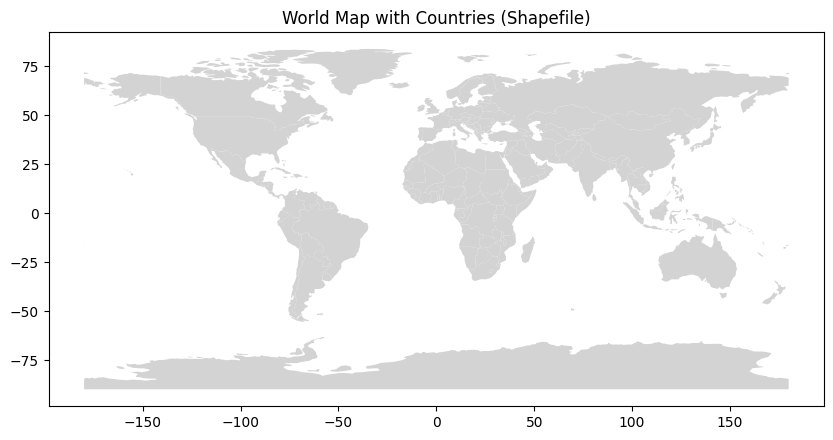

In [192]:
# Plot the world map with countries from the shapefile
fig, ax = plt.subplots(figsize=(10, 6))
world.plot(ax=ax, color='lightgrey')  # Base map
ax.set_title("World Map with Countries (Shapefile)")

plt.show()

## Step 8: Merging gdf and world dataframes

In [193]:
# Assuming the correct column name is 'NAME' (adjust if needed)
final_df = world.merge(gdf, left_on='NAME', right_on='Country')

# Select only the required columns
columns_to_keep = [
    'NAME',  # Country
    'Density\n(P/Km2)',  # Population Density
    'Abbreviation',  # Abbreviation
    'Agricultural Land( %)',  # Agricultural Land (%)
    'Land Area(Km2)',  # Land Area (Km2)
    'Armed Forces size',  # Armed Forces Size
    'Birth Rate',  # Birth Rate
    'Calling Code',  # Calling Code
    'Capital/Major City',  # Capital/Major City
    'Co2-Emissions',  # CO2 Emissions
    'CPI',  # CPI
    'CPI Change (%)',  # CPI Change (%)
    'Currency-Code',  # Currency Code
    'Fertility Rate',  # Fertility Rate
    'Forested Area (%)',  # Forested Area (%)
    'Gasoline Price',  # Gasoline Price
    'GDP',  # GDP
    'Gross primary education enrollment (%)',  # Gross Primary Education Enrollment
    'Gross tertiary education enrollment (%)',  # Gross Tertiary Education Enrollment
    'Infant mortality',  # Infant Mortality
    'Largest city',  # Largest City
    'Life expectancy',  # Life Expectancy
    'Maternal mortality ratio',  # Maternal Mortality Ratio
    'Minimum wage',  # Minimum Wage
    'Official language',  # Official Language
    'Out of pocket health expenditure',  # Out of Pocket Health Expenditure
    'Physicians per thousand',  # Physicians per Thousand
    'Population',  # Population
    'Population: Labor force participation (%)',  # Labor Force Participation (%)
    'Tax revenue (%)',  # Tax Revenue (%)
    'Total tax rate',  # Total Tax Rate
    'Unemployment rate',  # Unemployment Rate
    'Urban_population',  # Urban Population
    'Latitude',  # Latitude
    'Longitude',  # Longitude
]

# Keep only the required columns
final_df = final_df[columns_to_keep]
final_df

,NAME,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Fiji,49,FJ,23.30%,"18,274","4,000",21.280000,679.0,Suva,"2,046",...,21.40%,0.84000,"889,953",57.60%,24.20%,32.10%,4.10%,"505,048",-17.713371,178.065032
1,Tanzania,67,TZ,44.80%,"947,300","28,000",36.700000,255.0,Dodoma,"11,973",...,26.10%,0.01000,"58,005,463",83.40%,11.50%,43.80%,1.98%,"20,011,885",-6.369028,34.888822
2,Canada,4,CA,6.90%,"9,984,670","72,000",10.100000,1.0,Ottawa,"544,894",...,14.60%,2.61000,"36,991,981",65.10%,12.80%,24.50%,5.56%,"30,628,482",56.130366,-106.346771
3,United States of America,36,US,44.40%,"9,833,517","1,359,000",11.600000,1.0,"Washington, D.C.","5,006,302",...,11.10%,2.61000,"328,239,523",62.00%,9.60%,36.60%,14.70%,"270,663,028",37.090240,-95.712891
4,Kazakhstan,7,KZ,80.40%,"2,724,900","71,000",21.770000,7.0,Astana,"247,207",...,38.80%,3.25000,"18,513,930",68.80%,11.70%,28.40%,4.59%,"10,652,915",48.019573,66.923684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,Rwanda,525,RW,73.40%,"26,338","35,000",31.700000,250.0,Kigali,"1,115",...,26.00%,0.13000,"12,626,950",83.70%,14.30%,33.20%,1.03%,"2,186,104",-1.940278,29.873888
147,North Macedonia,83,NaN,NaN,"25,713",NaN,20.214974,389.0,Skopje,NaN,...,35.60%,1.83984,"1,836,713",NaN,NaN,NaN,NaN,NaN,41.608635,21.745275
148,Serbia,100,RS,39.30%,"77,474","32,000",9.200000,381.0,Belgrade,"45,221",...,40.60%,3.11000,"6,944,975",54.90%,18.60%,36.60%,12.69%,"3,907,243",44.016521,21.005859
149,Montenegro,47,ME,19.00%,"13,812","12,000",11.730000,382.0,Podgorica,"2,017",...,31.80%,2.76000,"622,137",54.40%,NaN,22.20%,14.88%,"417,765",42.708678,19.374390


## Cleaning final_df

In [194]:
final_df.columns

Index(['NAME', 'Density\n(P/Km2)', 'Abbreviation', 'Agricultural Land( %)',
       'Land Area(Km2)', 'Armed Forces size', 'Birth Rate', 'Calling Code',
       'Capital/Major City', 'Co2-Emissions', 'CPI', 'CPI Change (%)',
       'Currency-Code', 'Fertility Rate', 'Forested Area (%)',
       'Gasoline Price', 'GDP', 'Gross primary education enrollment (%)',
       'Gross tertiary education enrollment (%)', 'Infant mortality',
       'Largest city', 'Life expectancy', 'Maternal mortality ratio',
       'Minimum wage', 'Official language', 'Out of pocket health expenditure',
       'Physicians per thousand', 'Population',
       'Population: Labor force participation (%)', 'Tax revenue (%)',
       'Total tax rate', 'Unemployment rate', 'Urban_population', 'Latitude',
       'Longitude'],
      dtype='object')

## Cleaning few columns

In [195]:
# Remove the percentage sign and convert to numeric
final_df['Agricultural Land( %)'] = final_df['Agricultural Land( %)'].replace({'%': ''}, regex=True)

# Convert the values to numeric, coercing errors to NaN
final_df['Agricultural Land( %)'] = pd.to_numeric(final_df['Agricultural Land( %)'], errors='coerce')

# Filter out rows where the 'Agricultural Land( %)' value is not valid (NaN or out of range)
final_df = final_df[final_df['Agricultural Land( %)'] <= 100]
final_df = final_df[final_df['Agricultural Land( %)'] >= 0]

# Check data after cleaning
final_df

,NAME,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Fiji,49,FJ,23.3,"18,274","4,000",21.28,679.0,Suva,"2,046",...,21.40%,0.84,"889,953",57.60%,24.20%,32.10%,4.10%,"505,048",-17.713371,178.065032
1,Tanzania,67,TZ,44.8,"947,300","28,000",36.70,255.0,Dodoma,"11,973",...,26.10%,0.01,"58,005,463",83.40%,11.50%,43.80%,1.98%,"20,011,885",-6.369028,34.888822
2,Canada,4,CA,6.9,"9,984,670","72,000",10.10,1.0,Ottawa,"544,894",...,14.60%,2.61,"36,991,981",65.10%,12.80%,24.50%,5.56%,"30,628,482",56.130366,-106.346771
3,United States of America,36,US,44.4,"9,833,517","1,359,000",11.60,1.0,"Washington, D.C.","5,006,302",...,11.10%,2.61,"328,239,523",62.00%,9.60%,36.60%,14.70%,"270,663,028",37.090240,-95.712891
4,Kazakhstan,7,KZ,80.4,"2,724,900","71,000",21.77,7.0,Astana,"247,207",...,38.80%,3.25,"18,513,930",68.80%,11.70%,28.40%,4.59%,"10,652,915",48.019573,66.923684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,Uganda,229,UG,71.9,"241,038","46,000",38.14,256.0,Kampala,"5,680",...,40.50%,0.17,"44,269,594",70.30%,11.70%,33.70%,1.84%,"10,784,516",1.373333,32.290275
146,Rwanda,525,RW,73.4,"26,338","35,000",31.70,250.0,Kigali,"1,115",...,26.00%,0.13,"12,626,950",83.70%,14.30%,33.20%,1.03%,"2,186,104",-1.940278,29.873888
148,Serbia,100,RS,39.3,"77,474","32,000",9.20,381.0,Belgrade,"45,221",...,40.60%,3.11,"6,944,975",54.90%,18.60%,36.60%,12.69%,"3,907,243",44.016521,21.005859
149,Montenegro,47,ME,19.0,"13,812","12,000",11.73,382.0,Podgorica,"2,017",...,31.80%,2.76,"622,137",54.40%,NaN,22.20%,14.88%,"417,765",42.708678,19.374390


In [196]:
# Remove the percentage sign and convert to numeric
final_df['Forested Area (%)'] = final_df['Forested Area (%)'].replace({'%': ''}, regex=True)

# Convert the values to numeric, coercing errors to NaN
final_df['Forested Area (%)'] = pd.to_numeric(final_df['Forested Area (%)'], errors='coerce')

# Filter out rows where the 'Forested Area (%)' value is not valid (NaN or out of range)
final_df = final_df[final_df['Forested Area (%)'] <= 100]
final_df = final_df[final_df['Forested Area (%)'] >= 0]

# Check data after cleaning
final_df

,NAME,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Fiji,49,FJ,23.3,"18,274","4,000",21.28,679.0,Suva,"2,046",...,21.40%,0.84,"889,953",57.60%,24.20%,32.10%,4.10%,"505,048",-17.713371,178.065032
1,Tanzania,67,TZ,44.8,"947,300","28,000",36.70,255.0,Dodoma,"11,973",...,26.10%,0.01,"58,005,463",83.40%,11.50%,43.80%,1.98%,"20,011,885",-6.369028,34.888822
2,Canada,4,CA,6.9,"9,984,670","72,000",10.10,1.0,Ottawa,"544,894",...,14.60%,2.61,"36,991,981",65.10%,12.80%,24.50%,5.56%,"30,628,482",56.130366,-106.346771
3,United States of America,36,US,44.4,"9,833,517","1,359,000",11.60,1.0,"Washington, D.C.","5,006,302",...,11.10%,2.61,"328,239,523",62.00%,9.60%,36.60%,14.70%,"270,663,028",37.090240,-95.712891
4,Kazakhstan,7,KZ,80.4,"2,724,900","71,000",21.77,7.0,Astana,"247,207",...,38.80%,3.25,"18,513,930",68.80%,11.70%,28.40%,4.59%,"10,652,915",48.019573,66.923684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,Uganda,229,UG,71.9,"241,038","46,000",38.14,256.0,Kampala,"5,680",...,40.50%,0.17,"44,269,594",70.30%,11.70%,33.70%,1.84%,"10,784,516",1.373333,32.290275
146,Rwanda,525,RW,73.4,"26,338","35,000",31.70,250.0,Kigali,"1,115",...,26.00%,0.13,"12,626,950",83.70%,14.30%,33.20%,1.03%,"2,186,104",-1.940278,29.873888
148,Serbia,100,RS,39.3,"77,474","32,000",9.20,381.0,Belgrade,"45,221",...,40.60%,3.11,"6,944,975",54.90%,18.60%,36.60%,12.69%,"3,907,243",44.016521,21.005859
149,Montenegro,47,ME,19.0,"13,812","12,000",11.73,382.0,Podgorica,"2,017",...,31.80%,2.76,"622,137",54.40%,NaN,22.20%,14.88%,"417,765",42.708678,19.374390


In [197]:
# Remove the percentage sign and convert to numeric
final_df['Gross primary education enrollment (%)'] = final_df['Gross primary education enrollment (%)'].replace({'%': ''}, regex=True)

# Convert the values to numeric, coercing errors to NaN
final_df['Gross primary education enrollment (%)'] = pd.to_numeric(final_df['Gross primary education enrollment (%)'], errors='coerce')
final_df

,NAME,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Fiji,49,FJ,23.3,"18,274","4,000",21.28,679.0,Suva,"2,046",...,21.40%,0.84,"889,953",57.60%,24.20%,32.10%,4.10%,"505,048",-17.713371,178.065032
1,Tanzania,67,TZ,44.8,"947,300","28,000",36.70,255.0,Dodoma,"11,973",...,26.10%,0.01,"58,005,463",83.40%,11.50%,43.80%,1.98%,"20,011,885",-6.369028,34.888822
2,Canada,4,CA,6.9,"9,984,670","72,000",10.10,1.0,Ottawa,"544,894",...,14.60%,2.61,"36,991,981",65.10%,12.80%,24.50%,5.56%,"30,628,482",56.130366,-106.346771
3,United States of America,36,US,44.4,"9,833,517","1,359,000",11.60,1.0,"Washington, D.C.","5,006,302",...,11.10%,2.61,"328,239,523",62.00%,9.60%,36.60%,14.70%,"270,663,028",37.090240,-95.712891
4,Kazakhstan,7,KZ,80.4,"2,724,900","71,000",21.77,7.0,Astana,"247,207",...,38.80%,3.25,"18,513,930",68.80%,11.70%,28.40%,4.59%,"10,652,915",48.019573,66.923684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,Uganda,229,UG,71.9,"241,038","46,000",38.14,256.0,Kampala,"5,680",...,40.50%,0.17,"44,269,594",70.30%,11.70%,33.70%,1.84%,"10,784,516",1.373333,32.290275
146,Rwanda,525,RW,73.4,"26,338","35,000",31.70,250.0,Kigali,"1,115",...,26.00%,0.13,"12,626,950",83.70%,14.30%,33.20%,1.03%,"2,186,104",-1.940278,29.873888
148,Serbia,100,RS,39.3,"77,474","32,000",9.20,381.0,Belgrade,"45,221",...,40.60%,3.11,"6,944,975",54.90%,18.60%,36.60%,12.69%,"3,907,243",44.016521,21.005859
149,Montenegro,47,ME,19.0,"13,812","12,000",11.73,382.0,Podgorica,"2,017",...,31.80%,2.76,"622,137",54.40%,NaN,22.20%,14.88%,"417,765",42.708678,19.374390


In [198]:
# Remove the percentage sign and convert to numeric
final_df['Out of pocket health expenditure'] = final_df['Out of pocket health expenditure'].replace({'%': ''}, regex=True)

# Convert the values to numeric, coercing errors to NaN
final_df['Out of pocket health expenditure'] = pd.to_numeric(final_df['Out of pocket health expenditure'], errors='coerce')

# Check data after cleaning
final_df

,NAME,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Fiji,49,FJ,23.3,"18,274","4,000",21.28,679.0,Suva,"2,046",...,21.4,0.84,"889,953",57.60%,24.20%,32.10%,4.10%,"505,048",-17.713371,178.065032
1,Tanzania,67,TZ,44.8,"947,300","28,000",36.70,255.0,Dodoma,"11,973",...,26.1,0.01,"58,005,463",83.40%,11.50%,43.80%,1.98%,"20,011,885",-6.369028,34.888822
2,Canada,4,CA,6.9,"9,984,670","72,000",10.10,1.0,Ottawa,"544,894",...,14.6,2.61,"36,991,981",65.10%,12.80%,24.50%,5.56%,"30,628,482",56.130366,-106.346771
3,United States of America,36,US,44.4,"9,833,517","1,359,000",11.60,1.0,"Washington, D.C.","5,006,302",...,11.1,2.61,"328,239,523",62.00%,9.60%,36.60%,14.70%,"270,663,028",37.090240,-95.712891
4,Kazakhstan,7,KZ,80.4,"2,724,900","71,000",21.77,7.0,Astana,"247,207",...,38.8,3.25,"18,513,930",68.80%,11.70%,28.40%,4.59%,"10,652,915",48.019573,66.923684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,Uganda,229,UG,71.9,"241,038","46,000",38.14,256.0,Kampala,"5,680",...,40.5,0.17,"44,269,594",70.30%,11.70%,33.70%,1.84%,"10,784,516",1.373333,32.290275
146,Rwanda,525,RW,73.4,"26,338","35,000",31.70,250.0,Kigali,"1,115",...,26.0,0.13,"12,626,950",83.70%,14.30%,33.20%,1.03%,"2,186,104",-1.940278,29.873888
148,Serbia,100,RS,39.3,"77,474","32,000",9.20,381.0,Belgrade,"45,221",...,40.6,3.11,"6,944,975",54.90%,18.60%,36.60%,12.69%,"3,907,243",44.016521,21.005859
149,Montenegro,47,ME,19.0,"13,812","12,000",11.73,382.0,Podgorica,"2,017",...,31.8,2.76,"622,137",54.40%,NaN,22.20%,14.88%,"417,765",42.708678,19.374390


In [205]:
# Clean the population column by removing any commas and converting to numeric
final_df['Population'] = final_df['Population'].replace({',': ''}, regex=True)  # Remove commas
final_df['Population'] = pd.to_numeric(final_df['Population'], errors='coerce')  # Convert to numeric, invalid values become NaN

In [207]:
# Clean the population column by removing any commas and converting to numeric
final_df['Land Area(Km2)'] = final_df['Land Area(Km2)'].replace({',': ''}, regex=True)  # Remove commas
final_df['Land Area(Km2)'] = pd.to_numeric(final_df['Land Area(Km2)'], errors='coerce')  # Convert to numeric, invalid values become NaN

In [201]:
# Clean the population column by removing any commas and converting to numeric
final_df['Co2-Emissions'] = final_df['Co2-Emissions'].replace({',': ''}, regex=True)  # Remove commas
final_df['Co2-Emissions'] = pd.to_numeric(final_df['Co2-Emissions'], errors='coerce')  # Convert to numeric, invalid values become NaN

In [209]:
# Step 2: Clean GDP column
final_df['GDP'] = final_df['GDP'].str.replace('[\$,]', '', regex=True)
final_df['GDP'] = pd.to_numeric(final_df['GDP'], errors='coerce')

<>:2: SyntaxWarning:

invalid escape sequence '\$'

<>:2: SyntaxWarning:

invalid escape sequence '\$'

/var/folders/3l/hp2znwrj0rv_rl95k6pf5lwc0000gn/T/ipykernel_56491/2224561668.py:2: SyntaxWarning:

invalid escape sequence '\$'



AttributeError: Can only use .str accessor with string values!

In [212]:
final_df

,NAME,Density\n(P/Km2),Abbreviation,Agricultural Land( %),Land Area(Km2),Armed Forces size,Birth Rate,Calling Code,Capital/Major City,Co2-Emissions,...,Out of pocket health expenditure,Physicians per thousand,Population,Population: Labor force participation (%),Tax revenue (%),Total tax rate,Unemployment rate,Urban_population,Latitude,Longitude
0,Fiji,49,FJ,23.3,18274,"4,000",21.28,679.0,Suva,2046,...,21.4,0.84,889953,57.60%,24.20%,32.10%,4.10%,"505,048",-17.713371,178.065032
1,Tanzania,67,TZ,44.8,947300,"28,000",36.70,255.0,Dodoma,11973,...,26.1,0.01,58005463,83.40%,11.50%,43.80%,1.98%,"20,011,885",-6.369028,34.888822
2,Canada,4,CA,6.9,9984670,"72,000",10.10,1.0,Ottawa,544894,...,14.6,2.61,36991981,65.10%,12.80%,24.50%,5.56%,"30,628,482",56.130366,-106.346771
3,United States of America,36,US,44.4,9833517,"1,359,000",11.60,1.0,"Washington, D.C.",5006302,...,11.1,2.61,328239523,62.00%,9.60%,36.60%,14.70%,"270,663,028",37.090240,-95.712891
4,Kazakhstan,7,KZ,80.4,2724900,"71,000",21.77,7.0,Astana,247207,...,38.8,3.25,18513930,68.80%,11.70%,28.40%,4.59%,"10,652,915",48.019573,66.923684
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,Uganda,229,UG,71.9,241038,"46,000",38.14,256.0,Kampala,5680,...,40.5,0.17,44269594,70.30%,11.70%,33.70%,1.84%,"10,784,516",1.373333,32.290275
146,Rwanda,525,RW,73.4,26338,"35,000",31.70,250.0,Kigali,1115,...,26.0,0.13,12626950,83.70%,14.30%,33.20%,1.03%,"2,186,104",-1.940278,29.873888
148,Serbia,100,RS,39.3,77474,"32,000",9.20,381.0,Belgrade,45221,...,40.6,3.11,6944975,54.90%,18.60%,36.60%,12.69%,"3,907,243",44.016521,21.005859
149,Montenegro,47,ME,19.0,13812,"12,000",11.73,382.0,Podgorica,2017,...,31.8,2.76,622137,54.40%,NaN,22.20%,14.88%,"417,765",42.708678,19.374390


## Simple graphs to start with

In [218]:
# Sort the data by 'Agricultural Land( %)' in descending order
country_agriculture_sorted = final_df.sort_values(by='Agricultural Land( %)', ascending=False)

# Create the bar chart
fig = px.bar(country_agriculture_sorted, 
             x='NAME', 
             y='Agricultural Land( %)', 
             title='Country vs Agricultural Land (%)',
             labels={'Agricultural Land( %)': 'Agricultural Land (%)', 'NAME': 'Country'},
             color='Agricultural Land( %)',  # Color based on Agricultural Land %
             color_continuous_scale='Viridis')

# Rotate the x-axis labels for better readability
fig.update_layout(xaxis_tickangle=-90)

# Show the plot
fig.show()

In [219]:
# Select the necessary columns for plotting Country vs Currency Code
country_currency = final_df[['NAME', 'Currency-Code']]

# Count the occurrences of each Currency Code
currency_count = country_currency.groupby('Currency-Code').size().reset_index(name='Country Count')

# Sort by 'Country Count' to visualize the most common currency codes
currency_count_sorted = currency_count.sort_values(by='Country Count', ascending=False)

# Create the bar chart
fig = px.bar(currency_count_sorted, 
             x='Currency-Code', 
             y='Country Count', 
             title='Currency Code Usage by Country',
             labels={'Country Count': 'Number of Countries', 'Currency-Code': 'Currency Code'},
             color='Country Count',  # Color based on the number of countries
             color_continuous_scale='Viridis')

# Rotate the x-axis labels for better readability
fig.update_layout(xaxis_tickangle=-45)

# Show the plot
fig.show()

# World maps

## Define functions

In [245]:
## Step 1: Load shapefile data and common functions
shapefile_path = '/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/data/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp'
world = gpd.read_file(shapefile_path).rename(columns={'ADMIN': 'country'})

def clean_and_merge_data(geo_df, data_df, column_name, additional_data=None):
    """
    Clean, merge, and handle missing values in data for visualization.
    """
    if additional_data is not None:
        data_df = pd.concat([data_df, additional_data], ignore_index=True)
        data_df = data_df.drop_duplicates(subset='country', keep='last')
    
    return pd.merge(geo_df, data_df[['country', column_name]], on='country', how='left')

def normalize_column(df, column_name):
    """
    Normalize a column to a 0-1 range.
    """
    min_val = df[column_name].min()
    max_val = df[column_name].max()
    df[f'Normalized_{column_name}'] = (df[column_name] - min_val) / (max_val - min_val)
    return df, min_val, max_val

def create_map(geo_df, column_name, colormap_gradient, output_file, tooltip_aliases):
    """
    Create and display a folium map with the given GeoDataFrame and parameters.
    """
    colormap = LinearColormap(colors=colormap_gradient, vmin=0, vmax=1)
    colormap.caption = f'<span style="color: white;">{tooltip_aliases[1]} ({colormap_gradient[0]} -> {colormap_gradient[-1]})</span>'
    
    m = folium.Map(location=[0, 0], zoom_start=2, tiles="cartodb dark_matter")
    
    def style_function(feature):
        value = feature['properties'].get(column_name)
        if pd.isna(value):
            return {'fillColor': 'gray', 'color': 'white', 'weight': 0.3, 'fillOpacity': 0.7}
        normalized_value = feature['properties'].get(f'Normalized_{column_name}', 0)
        return {'fillColor': colormap(normalized_value), 'color': 'white', 'weight': 0.3, 'fillOpacity': 0.7}
    
    tooltip = folium.features.GeoJsonTooltip(fields=['country', column_name], aliases=tooltip_aliases, localize=True)
    geojson = folium.GeoJson(geo_df, style_function=style_function, tooltip=tooltip)
    geojson.add_to(m)
    colormap.add_to(m)
    
    m.save(output_file)
    display(m)

## Plot population map

In [246]:
## Step 2: Prepare population data
population_additional = pd.DataFrame({
    'country': ['United States of America', 'Ireland', 'Somaliland', 'Republic of the Congo', 
                'United Republic of Tanzania', 'Central African Republic', 'South Sudan', 
                'Democratic Republic of the Congo', 'Equatorial Guinea', 'Bangladesh', 
                'Ivory Coast', 'Czechia', 'North Macedonia', 'Bosnia and Herzegovina', 
                'Republic of Serbia'],
    'Population': [328239523, 5007069, 15442905, 5380508, 58005463, 4745185, 11062113, 
                   86790567, 1355986, 167310838, 25716544, 10669709, 1836713, 3301000, 6944975]
})

merged_population = clean_and_merge_data(world, final_df.rename(columns={'NAME': 'country'}), 'Population', population_additional)
merged_population, min_pop, max_pop = normalize_column(merged_population, 'Population')
## Step 3: Create population map
create_map(
    merged_population, 'Population', ['lightgreen', 'green', 'orange', 'red'], 
    "/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/1population_map.html",
    ['Country:', 'Population']
)

## Plot Agricultural Land Map

In [251]:
## Step 4: Prepare agricultural land data
agriculture_additional = pd.DataFrame({
    'country': ['United States of America', 'Ireland', 'Somaliland', 'Republic of the Congo', 
                'United Republic of Tanzania', 'Central African Republic', 'South Sudan', 
                'Democratic Republic of the Congo', 'Equatorial Guinea', 'Bangladesh', 
                'Ivory Coast', 'Czechia', 'North Macedonia', 'Bosnia and Herzegovina', 
                'Republic of Serbia'],
    'Agricultural Land( %)': [44.4, 64.5, 70.3, 8.20, 44.8, 65.4, 0.4, 11.60, 10.10, 
                                     70.70, 64.80, 45.20, 0.0, 43.10, 39.30]
})

merged_agriculture = clean_and_merge_data(world, final_df.rename(columns={'NAME': 'country'}), 'Agricultural Land( %)', agriculture_additional)
merged_agriculture, min_agriculture, max_agriculture = normalize_column(merged_agriculture, 'Agricultural Land( %)')

## Step 5: Create agricultural land map
create_map(
    merged_agriculture, 'Agricultural Land( %)', ['lightyellow', 'yellow', 'orange', 'red'], 
    "/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/2agricultural_land_map.html",
    ['Country:', 'Agricultural Land (%)']
)

## Birth Rate

In [252]:
birthrate_data = pd.DataFrame({
    'country': ['United States of America', 'Ireland', 
                'Somaliland', 'Republic of the Congo', 
                'United Republic of Tanzania', 'Central African Republic', 
                'South Sudan', 'Democratic Republic of the Congo', 
                'Equatorial Guinea', 'Bangladesh', 
                'Ivory Coast', 'Czechia', 
                'North Macedonia', 'Bosnia and Herzegovina', 
                'Republic of Serbia'],
    'Birth Rate': [11.6, 12.5, 
                                     41.75, 32.86,
                                     36.7, 35.35,
                                     35.01, 41.18,
                                     33.24, 18.18,
                                     35.74, 10.7,
                                     0.0, 8.11,
                                     9.2]
})

merged_birthrate = clean_and_merge_data(world, final_df.rename(columns={'NAME': 'country'}), 'Birth Rate', birthrate_data)
merged_birthrate, min_br, max_br = normalize_column(merged_birthrate, 'Birth Rate')

## Step 5: Create agricultural land map
create_map(
    merged_birthrate, 'Birth Rate', ['green', 'yellow', 'orange', 'red'], 
    "/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/birth_rate_map.html",
    ['Country:', 'Birth Rate']
)

## Forested Land

In [253]:
forest_data = pd.DataFrame({
    'country': ['United States of America', 'Ireland', 
                'Somaliland', 'Republic of the Congo', 
                'United Republic of Tanzania', 'Central African Republic', 
                'South Sudan', 'Democratic Republic of the Congo', 
                'Equatorial Guinea', 'Bangladesh', 
                'Ivory Coast', 'Czechia', 
                'North Macedonia', 'Bosnia and Herzegovina', 
                'Republic of Serbia'],
    'Forested Area (%)': [33.9, 11.0, 
                                 10.0, 65.4,
                                 51.6, 35.6,
                                 0.0, 67.2,
                                 55.5, 11.0,
                                 32.7, 34.6,
                                 0.0, 42.7,
                                 31.1]
})

merged_forestdata = clean_and_merge_data(world, final_df.rename(columns={'NAME': 'country'}), 'Forested Area (%)', forest_data)
merged_forestdata, min_f, max_f = normalize_column(merged_forestdata, 'Forested Area (%)')

## Step 5: Create agricultural land map
create_map(
    merged_forestdata, 'Forested Area (%)', ['white', 'lightgreen', 'green', 'darkgreen'], 
    "/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/forest_area_map.html",
    ['Country:', 'Forested Area (%)']
)

## Life Expectancy

In [254]:
life_expectancy_data = pd.DataFrame({
    'country': ['United States of America', 'Ireland', 
                'Somaliland', 'Republic of the Congo', 
                'United Republic of Tanzania', 'Central African Republic', 
                'South Sudan', 'Democratic Republic of the Congo', 
                'Equatorial Guinea', 'Bangladesh', 
                'Ivory Coast', 'Czechia', 
                'North Macedonia', 'Bosnia and Herzegovina', 
                'Republic of Serbia'],
    'Life expectancy': [78.5, 82.3, 
                        57.1, 64.3, 
                        65, 52.8, 
                        57.6, 60.5, 
                        58.4, 72.3, 
                        57.8, 79.2, 
                        76.5, 77.1, 
                        75.5]
})

merged_lifeexp = clean_and_merge_data(world, final_df.rename(columns={'NAME': 'country'}), 'Life expectancy', life_expectancy_data)
merged_lifeexp, min_le, max_le = normalize_column(merged_lifeexp, 'Life expectancy')

## Step 5: Create agricultural land map
create_map(
    merged_lifeexp, 'Life expectancy', ['white', '#FFCC80', 'orange', 'darkorange'], 
    "/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/life_expectancy_map.html",
    ['Country:', 'Life expectancy']
)

## GDP

In [264]:
# Step 1: Prepare the initial data
merged_cleaned_copy = final_df.copy()
merged_cleaned_copy = merged_cleaned_copy.rename(columns={'NAME': 'country'})

# Step 2: Clean the 'GDP' column
merged_cleaned_copy['GDP'] = (
    merged_cleaned_copy['GDP']
    .replace({'\$|,': ''}, regex=True)  # Remove $ and commas
    .astype(float)
)

# Step 3: Clean country names for consistency
world['country'] = world['country'].str.strip().str.lower()
merged_cleaned_copy['country'] = merged_cleaned_copy['country'].str.strip().str.lower()

# Step 4: Integrate additional GDP data
additional_gdp_data = pd.DataFrame({
    'country': [
        'united states of america', 'ireland', 
        'somaliland', 'republic of the congo', 
        'united republic of tanzania', 'central african republic', 
        'south sudan', 'democratic republic of the congo', 
        'equatorial guinea', 'bangladesh', 
        'ivory coast', 'czechia', 
        'north macedonia', 'bosnia and herzegovina', 
        'republic of serbia'
    ],
    'GDP': [
        21427700000000, 388698711348, 
        4720727278, 10820591131, 
        63177068175, 2220307369, 
        11997800751, 47319624204, 
        11026774945, 302571254131, 
        58792205642, 246489245495, 
        32100000000, 20047848435, 
        51409167351
    ]
})
additional_gdp_data['country'] = additional_gdp_data['country'].str.strip().str.lower()

# Step 5: Merge and normalize the data using functions
world_gdp = clean_and_merge_data(world, merged_cleaned_copy, 'GDP', additional_gdp_data)
world_gdp, min_gdp, max_gdp = normalize_column(world_gdp, 'GDP')

# Step 6: Create and display the map
output_path = "/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/gdp_map.html"
create_map(
    world_gdp,
    'GDP',
    ['white', '#fac2c2', '#fac2c2', '#fb3535'],
    output_path,
    ['Country:', 'GDP']
)

<>:8: SyntaxWarning:

invalid escape sequence '\$'

<>:8: SyntaxWarning:

invalid escape sequence '\$'

/var/folders/3l/hp2znwrj0rv_rl95k6pf5lwc0000gn/T/ipykernel_56491/2148925309.py:8: SyntaxWarning:

invalid escape sequence '\$'



## CO2 - Emissions Maps

In [266]:
# Step 1: Create a copy of the merged_cleaned DataFrame
merged_cleaned_copy = final_df.copy()
merged_cleaned_copy = merged_cleaned_copy.rename(columns={'NAME': 'country'})

# Step 2: Clean the 'CO2_Emissions' column (remove non-numeric characters and convert to float)
merged_cleaned_copy['Co2-Emissions'] = (
    merged_cleaned_copy['Co2-Emissions']
    .replace({',': ''}, regex=True)  # Remove commas
    .astype(float)
)

# Step 3: Clean country names for consistency
world['country'] = world['country'].str.strip().str.lower()
merged_cleaned_copy['country'] = merged_cleaned_copy['country'].str.strip().str.lower()

# Step 6: Integrate additional CO2 data
additional_co2_data = pd.DataFrame({
    'country': [
        'united states of america', 'ireland', 'somaliland', 'republic of the congo', 
        'united republic of tanzania', 'central african republic', 'south sudan', 'democratic republic of the congo', 
        'equatorial guinea', 'bangladesh', 'ivory coast', 'czechia', 
        'north macedonia', 'bosnia and herzegovina', 
        'republic of serbia'
    ],
    'Co2-Emissions': [
        5006302, 37711, 645, 3282, 
        11973, 297, 1727, 2021, 
        5655, 84246, 9674, 102218, 
        62434, 21848, 45221
    ]
})
additional_co2_data['country'] = additional_co2_data['country'].str.strip().str.lower()

# Step 5: Merge and normalize the data using functions
world_co2 = clean_and_merge_data(world, merged_cleaned_copy, 'Co2-Emissions', additional_co2_data)
world_co2, min_co2, max_co2 = normalize_column(world_co2, 'Co2-Emissions')

# Step 6: Create and display the map
output_path = "/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/Co2_map.html"
create_map(
    world_co2,
    'Co2-Emissions',
    ['white', '#efc7fa', '#d964fa', '#c504fa'],
    output_path,
    ['Country:', 'Co2-Emissions']
)

## Health Care

In [242]:
# Step 1: Create a copy of the merged_cleaned DataFrame
merged_cleaned_copy = final_df.copy()
merged_cleaned_copy = merged_cleaned_copy.rename(columns={'NAME': 'country'})

# Step 2: Clean the 'Out of pocket health expenditure' column (remove non-numeric characters and convert to float)
merged_cleaned_copy['Out_of_pocket_health_expenditure'] = (
    merged_cleaned_copy['Out of pocket health expenditure']
    .replace({'%': '', ',': ''}, regex=True)  # Remove '%' and commas
    .astype(float)
)

# Step 3: Load GeoDataFrame and rename columns for consistency
world = gpd.read_file('/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/data/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp')
world = world.rename(columns={'ADMIN': 'country'})  # Rename column for consistency

# Step 4: Normalize country names for matching
world['country'] = world['country'].str.strip().str.lower()
merged_cleaned_copy['country'] = merged_cleaned_copy['country'].str.strip().str.lower()

# Step 5: Merge Out of pocket health expenditure data with world GeoDataFrame
world_health_exp = pd.merge(world, merged_cleaned_copy[['country', 'Out_of_pocket_health_expenditure']], on='country', how='left')

# Step 6: Integrate additional Out of pocket health expenditure data (if necessary)
additional_health_data = pd.DataFrame({
    'country': [
        'united states of america', 'ireland', 
        'somaliland', 'republic of the congo', 
        'united republic of tanzania', 'central african republic', 
        'south sudan', 'democratic republic of the congo', 
        'equatorial guinea', 'bangladesh', 
        'ivory coast', 'czechia', 
        'north macedonia', 'bosnia and herzegovina', 
        'republic of serbia'
    ],
    'Out_of_pocket_health_expenditure': [
        11.10, 15.20, 28.10, 43.80, 
        26.40, 39.60, 61.30, 37.40, 
        72.00, 71.80, 39.80, 14.00, 
        28.60, 39.50, 40.80
    ]
})
additional_health_data['country'] = additional_health_data['country'].str.strip().str.lower()

# Merge additional health expenditure data
world_health_exp = pd.merge(world_health_exp, additional_health_data[['country', 'Out_of_pocket_health_expenditure']], on='country', how='left', suffixes=('', '_additional'))

# Fill missing values in 'Out_of_pocket_health_expenditure' with additional data
world_health_exp['Out_of_pocket_health_expenditure'] = world_health_exp['Out_of_pocket_health_expenditure'].fillna(world_health_exp['Out_of_pocket_health_expenditure_additional'])

# Step 7: Normalize the Out of pocket health expenditure values to [0, 1] range
min_health_exp = world_health_exp['Out_of_pocket_health_expenditure'].min()
max_health_exp = world_health_exp['Out_of_pocket_health_expenditure'].max()
world_health_exp['Normalized_Health_Exp'] = (world_health_exp['Out_of_pocket_health_expenditure'] - min_health_exp) / (max_health_exp - min_health_exp)

# Step 8: Define the custom colormap (from light green to dark green for health expenditure)
colormap = LinearColormap(['white', '#d0acfb', '#aa67fa', '#7404fa'], vmin=0, vmax=1)

# Step 9: Create a folium map
m = folium.Map(location=[0, 0], zoom_start=2, tiles="cartodb dark_matter")

# Add GeoJSON to the map with hover functionality and dynamic colors
def style_function(feature):
    health_exp = feature['properties']['Out_of_pocket_health_expenditure']
    
    # Normalize health expenditure to a [0, 1] range
    if pd.isna(health_exp) or health_exp == 0:
        return {
            'fillColor': 'gray', 
            'color': 'white',
            'weight': 0.3,
            'fillOpacity': 0.7
        }
    
    normalized_health_exp = (health_exp - min_health_exp) / (max_health_exp - min_health_exp)
    
    return {
        'fillColor': colormap(normalized_health_exp),
        'color': 'white',
        'weight': 0.3,
        'fillOpacity': 0.7
    }

highlight_function = lambda x: {'weight': 3, 'color': 'cyan', 'fillOpacity': 0.9}

tooltip = folium.features.GeoJsonTooltip(
    fields=['country', 'Out_of_pocket_health_expenditure'],
    aliases=['Country:', 'Out of Pocket Health Expenditure (%)'],
    localize=True
)

geojson = folium.GeoJson(
    world_health_exp,
    style_function=style_function,
    highlight_function=highlight_function,
    tooltip=tooltip
)

geojson.add_to(m)

# Add the colormap to the map
colormap.add_to(m)

# Add the colormap legend to the map
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 300px; height: 60px; 
            border:2px solid grey; z-index:9999; font-size: 16px; 
            background-color: rgba(0, 0, 0, 0.7); color: white; padding: 10px;">
    <b>Out of Pocket Health Expenditure (Light -> Dark Green)</b><br>
    {}</div>
'''.format(colormap._repr_html_())

m.get_root().html.add_child(folium.Element(legend_html))

# Step 10: Display and save the map
display(m)
m.save("/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/health_exp_map.html")

## Tax Maps

In [243]:
# Step 1: Create a copy of the merged_cleaned DataFrame
merged_cleaned_copy = final_df.copy()
merged_cleaned_copy = merged_cleaned_copy.rename(columns={'NAME': 'country'})

# Step 2: Clean the 'Total tax rate' column (remove non-numeric characters and convert to float)
merged_cleaned_copy['Total_tax_rate'] = (
    merged_cleaned_copy['Total tax rate']
    .replace({'%': '', ',': ''}, regex=True)  # Remove '%' and commas
    .astype(float)
)

# Step 3: Load GeoDataFrame and rename columns for consistency
world = gpd.read_file('/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/data/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp')
world = world.rename(columns={'ADMIN': 'country'})  # Rename column for consistency

# Step 4: Normalize country names for matching
world['country'] = world['country'].str.strip().str.lower()
merged_cleaned_copy['country'] = merged_cleaned_copy['country'].str.strip().str.lower()

# Step 5: Merge Total tax rate data with world GeoDataFrame
world_tax_rate = pd.merge(world, merged_cleaned_copy[['country', 'Total_tax_rate']], on='country', how='left')

# Step 6: Integrate additional Total tax rate data (if necessary)
additional_tax_data = pd.DataFrame({
    'country': [
        'united states of america', 'ireland', 'somaliland', 'republic of the congo', 
        'united republic of tanzania', 'central african republic', 'south sudan', 'democratic republic of the congo', 
        'equatorial guinea', 'bangladesh', 
        'ivory coast', 'czechia', 
        'north macedonia', 'bosnia and herzegovina', 
        'republic of serbia'
    ],
    'Total_tax_rate': [
        36.60, 26.10, 66.10, 54.30, 
        43.10, 50.20, 41.50, 50.40, 
        79.0, 33.30, 50.50, 46.10, 
        51.70, 23.70, 36.00
    ]
})
additional_tax_data['country'] = additional_tax_data['country'].str.strip().str.lower()

# Merge additional tax data
world_tax_rate = pd.merge(world_tax_rate, additional_tax_data[['country', 'Total_tax_rate']], on='country', how='left', suffixes=('', '_additional'))

# Fill missing values in 'Total_tax_rate' with additional data
world_tax_rate['Total_tax_rate'] = world_tax_rate['Total_tax_rate'].fillna(world_tax_rate['Total_tax_rate_additional'])

# Step 7: Normalize the Total tax rate values to [0, 1] range
min_tax_rate = world_tax_rate['Total_tax_rate'].min()
max_tax_rate = world_tax_rate['Total_tax_rate'].max()
world_tax_rate['Normalized_Tax_Rate'] = (world_tax_rate['Total_tax_rate'] - min_tax_rate) / (max_tax_rate - min_tax_rate)

# Step 8: Define the custom colormap (from light yellow to dark red for tax rate)
colormap = LinearColormap(['white', '#f9c1db', '#fa84ba', '#fa3b92'], vmin=0, vmax=1)

# Step 9: Create a folium map
m = folium.Map(location=[0, 0], zoom_start=2, tiles="cartodb dark_matter")

# Add GeoJSON to the map with hover functionality and dynamic colors
def style_function(feature):
    tax_rate = feature['properties']['Total_tax_rate']
    
    # Normalize tax rate to a [0, 1] range
    if pd.isna(tax_rate) or tax_rate == 0:
        return {
            'fillColor': 'gray', 
            'color': 'white',
            'weight': 0.3,
            'fillOpacity': 0.7
        }
    
    normalized_tax_rate = (tax_rate - min_tax_rate) / (max_tax_rate - min_tax_rate)
    
    return {
        'fillColor': colormap(normalized_tax_rate),
        'color': 'white',
        'weight': 0.3,
        'fillOpacity': 0.7
    }

highlight_function = lambda x: {'weight': 3, 'color': 'cyan', 'fillOpacity': 0.9}

tooltip = folium.features.GeoJsonTooltip(
    fields=['country', 'Total_tax_rate'],
    aliases=['Country:', 'Total Tax Rate (%)'],
    localize=True
)

geojson = folium.GeoJson(
    world_tax_rate,
    style_function=style_function,
    highlight_function=highlight_function,
    tooltip=tooltip
)

geojson.add_to(m)

# Add the colormap to the map
colormap.add_to(m)

# Add the colormap legend to the map
legend_html = '''
<div style="position: fixed; 
            bottom: 50px; left: 50px; width: 300px; height: 60px; 
            border:2px solid grey; z-index:9999; font-size: 16px; 
            background-color: rgba(0, 0, 0, 0.7); color: white; padding: 10px;">
    <b>Total Tax Rate (Light -> Dark Yellow/Red)</b><br>
    {}</div>
'''.format(colormap._repr_html_())

m.get_root().html.add_child(folium.Element(legend_html))

# Step 10: Display and save the map
display(m)
m.save("/Users/shusritavenugopal/Documents/MSIS/FALL2024/InformationVisualization/Final Project/tax_rate_map.html")

# Exploring Various Relationships

## Which countries are densely populated relative to their land area?

In [267]:
import plotly.express as px
import pandas as pd

# Clean 'Land Area(Km2)' and 'Density\n(P/Km2)' columns:
# Remove commas from 'Land Area(Km2)' and convert to float
final_df['Land Area(Km2)'] = final_df['Land Area(Km2)'].replace({',': ''}, regex=True).astype(float)

# Convert 'Density\n(P/Km2)' to float, ignoring errors
final_df['Density\n(P/Km2)'] = pd.to_numeric(final_df['Density\n(P/Km2)'], errors='coerce')

# Remove rows with NaN values in 'Density\n(P/Km2)' and 'Land Area(Km2)' columns
merged_cleaned = final_df.dropna(subset=['Density\n(P/Km2)', 'Land Area(Km2)'])

# Calculate population density if not already present
merged_cleaned['Calculated Population Density'] = merged_cleaned['Population'] / merged_cleaned['Land Area(Km2)']

# Sort by Land Area (smallest first) and then by Population Density (largest first)
top_10_population_density = merged_cleaned.sort_values(by=['Land Area(Km2)', 'Calculated Population Density'], ascending=[True, False]).head(10)

# Create a scatter plot for population density vs. land area
fig = px.scatter(top_10_population_density, 
                 x='Land Area(Km2)', 
                 y='Calculated Population Density', 
                 size='Calculated Population Density',  # Bubble size reflects population density
                 hover_name='NAME',  # Display country name on hover
                 title='Top 10 Densely Populated Countries Relative to their Land Area',
                 labels={'Calculated Population Density': 'Population Density (People/Km²)', 
                         'Land Area(Km2)': 'Land Area (Km²)'},
                 color='Calculated Population Density',  # Color by population density
                 template='plotly_dark')

# Add country names as text labels on the plot (always visible)
fig.update_traces(
    text=top_10_population_density['NAME'], 
    textposition='top center', 
    mode='markers+text'  # Ensure both markers and text are shown
)

# Update layout for better readability
fig.update_layout(
    title_font=dict(size=20, color='white'),
    font=dict(color='white'),
    plot_bgcolor='rgb(20, 20, 20)',
    paper_bgcolor='rgb(20, 20, 20)',
    margin=dict(t=50, b=50, l=50, r=50)
)

fig.show()

/var/folders/3l/hp2znwrj0rv_rl95k6pf5lwc0000gn/T/ipykernel_56491/3785564332.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Investigating the relationship between agricultural land and food security.

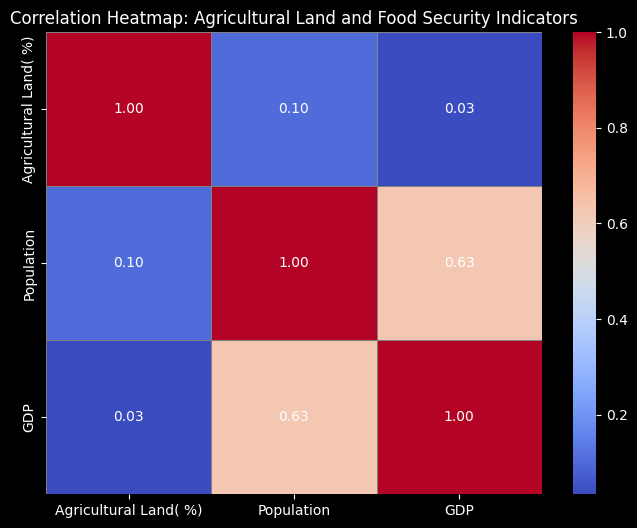

In [274]:
# Set dark theme for the plot
plt.style.use('dark_background')

# Clean 'Agricultural Land( %)' column: Remove '%' and convert to float
final_df['Agricultural Land( %)'] = final_df['Agricultural Land( %)'].replace({r'%': ''}, regex=True).astype(float)

# Clean 'GDP' column: Remove '$' and ',' and convert to numeric
final_df['GDP'] = final_df['GDP'].replace({r'[$,]': ''}, regex=True).astype(float)

# Drop rows with missing values in 'Agricultural Land( %)', 'Population', 'GDP', or 'Life expectancy'
agriculture_cleaned = final_df.dropna(subset=['Agricultural Land( %)', 'Population', 'GDP'])

# Calculate correlation matrix
correlation_matrix = agriculture_cleaned[['Agricultural Land( %)', 'Population', 'GDP']].corr()

# Plot heatmap with adjustments for dark theme
plt.figure(figsize=(8, 6))
sns.heatmap(
    correlation_matrix,
    annot=True,
    cmap='coolwarm',  # Use a colormap that contrasts well with a dark background
    annot_kws={"color": "white"},  # Annotation text in white for visibility
    fmt=".2f",
    linewidths=0.5,
    linecolor='gray'
)
plt.title('Correlation Heatmap: Agricultural Land and Food Security Indicators', color='white')
plt.xticks(color='white')
plt.yticks(color='white')
plt.show()


## Analyzing healthcare metrics like Infant Mortality and Life Expectancy

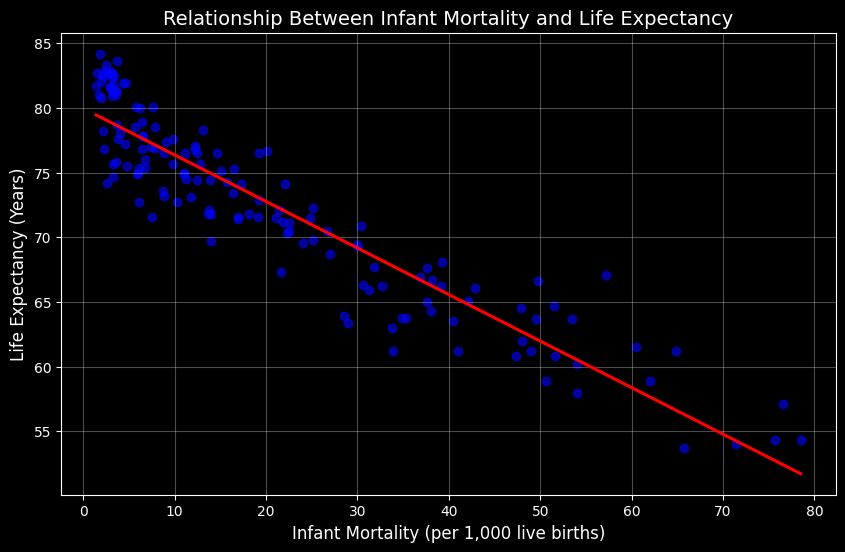

In [275]:
# Drop rows with missing values in 'Infant mortality' or 'Life expectancy'
healthcare_cleaned = final_df.dropna(subset=['Infant mortality', 'Life expectancy'])

# Plot scatter plot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(
    data=healthcare_cleaned,
    x='Infant mortality',
    y='Life expectancy',
    scatter_kws={'color': 'blue', 'alpha': 0.6},
    line_kws={'color': 'red'},
    ci=None
)

# Add labels and title
plt.title('Relationship Between Infant Mortality and Life Expectancy', fontsize=14)
plt.xlabel('Infant Mortality (per 1,000 live births)', fontsize=12)
plt.ylabel('Life Expectancy (Years)', fontsize=12)
plt.grid(visible=True, alpha=0.3)
plt.show()

## Top 35 Countries with Low Infant Mortality and High Life Expectancy

Top 35 Countries with Low Infant Mortality and High Life Expectancy:
                         NAME  Infant mortality  Life expectancy
135                     Japan               1.8             84.2
111               Switzerland               3.7             83.6
116                     Spain               2.5             83.3
122                     Italy               2.6             82.9
62                     Israel               3.0             82.8
16                     Norway               2.1             82.8
119                 Australia               3.1             82.7
125                   Iceland               1.5             82.7
80                South Korea               2.7             82.6
94                     Sweden               2.2             82.5
35                     France               3.4             82.5
117                   Ireland               3.1             82.3
112                Luxembourg               1.9             82.1
118               New

/var/folders/3l/hp2znwrj0rv_rl95k6pf5lwc0000gn/T/ipykernel_56491/640587249.py:23: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




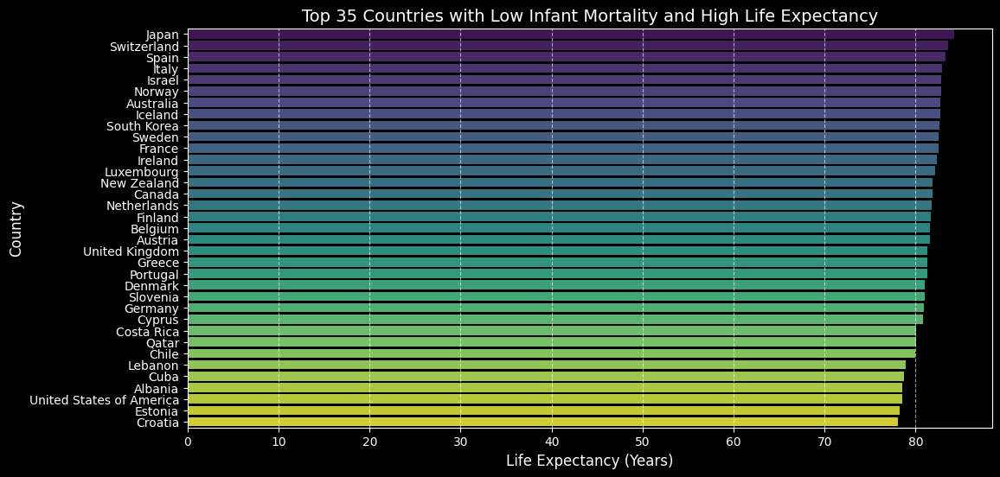

In [276]:
# Define thresholds for low infant mortality and high life expectancy
low_infant_mortality_threshold = 10  # Adjust as needed
high_life_expectancy_threshold = 75  # Adjust as needed

# Filter countries with low infant mortality and high life expectancy
high_wellbeing_countries = healthcare_cleaned[
    (healthcare_cleaned['Infant mortality'] < low_infant_mortality_threshold) &
    (healthcare_cleaned['Life expectancy'] > high_life_expectancy_threshold)
][['NAME', 'Infant mortality', 'Life expectancy']]

# Sort by life expectancy
high_wellbeing_countries = high_wellbeing_countries.sort_values(by='Life expectancy', ascending=False)

# Select the top 30 countries
high_wellbeing_countries_top35 = high_wellbeing_countries.head(35)

# Display the top countries in a table format
print("Top 35 Countries with Low Infant Mortality and High Life Expectancy:")
print(high_wellbeing_countries_top35)

# Plot a bar chart for the top 30 countries
plt.figure(figsize=(12, 6))
sns.barplot(
    data=high_wellbeing_countries_top35,
    x='Life expectancy',
    y='NAME',
    palette='viridis'
)

# Add labels and title
plt.title('Top 35 Countries with Low Infant Mortality and High Life Expectancy', fontsize=14)
plt.xlabel('Life Expectancy (Years)', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.show()

## Examine carbon dioxide emissions and their impact on climate change.

In [278]:
final_df["Co2-Emissions"]

0         2046
1        11973
2       544894
3      5006302
4       247207
        ...   
145       5680
146       1115
148      45221
149       2017
150      43868
Name: Co2-Emissions, Length: 150, dtype: int64

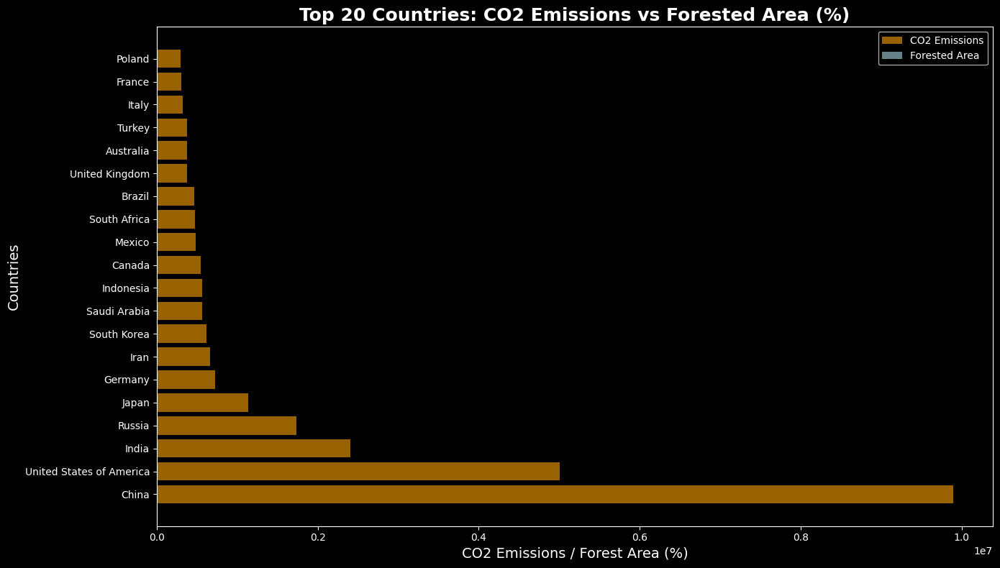

In [279]:
# Set dark background for better visibility
plt.style.use('dark_background')

# Step 1: Clean the data
merged_copy = final_df.copy()

# Drop rows with missing or invalid data in either of these columns
merged_cleaned = merged_copy.dropna(subset=['Co2-Emissions', 'Forested Area (%)'])

# Step 2: Sort the data by 'Co2-Emissions' in descending order
merged_sorted = merged_cleaned.sort_values(by='Co2-Emissions', ascending=False)

# Step 3: Take the top 20 countries
top_20_countries = merged_sorted.head(20)

plt.figure(figsize=(14, 8))

# Create two bar plots for CO2 emissions and forest area side by side
top_20_countries_sorted = top_20_countries.sort_values(by='Co2-Emissions', ascending=False)

plt.barh(top_20_countries_sorted['NAME'], top_20_countries_sorted['Co2-Emissions'], color='orange', alpha=0.6, label='CO2 Emissions')
plt.barh(top_20_countries_sorted['NAME'], top_20_countries_sorted['Forested Area (%)'], color='lightblue', alpha=0.6, label='Forested Area')

plt.title('Top 20 Countries: CO2 Emissions vs Forested Area (%)', fontsize=18, color='white', weight='bold')
plt.xlabel('CO2 Emissions / Forest Area (%)', fontsize=14, color='white')
plt.ylabel('Countries', fontsize=14, color='white')

plt.legend()
plt.tight_layout()
plt.show()

## Investigating educational enrollment rates and their implications for human capital development.

In [285]:
final_df["Population: Labor force participation (%)"]

0      57.60%
1      83.40%
2      65.10%
3      62.00%
4      68.80%
        ...  
145    70.30%
146    83.70%
148    54.90%
149    54.40%
150    60.00%
Name: Population: Labor force participation (%), Length: 150, dtype: object

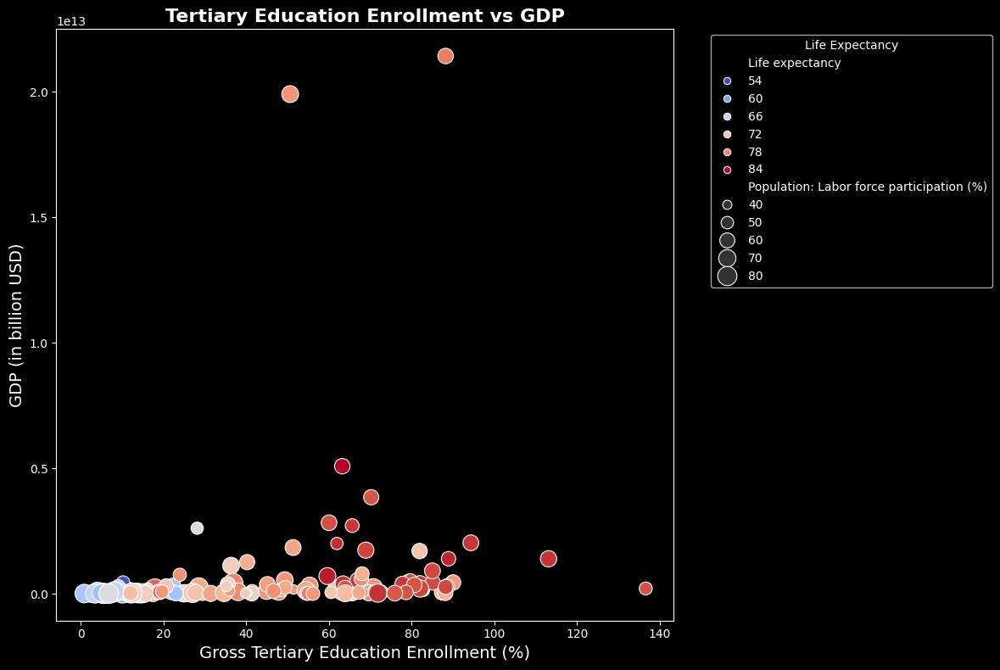

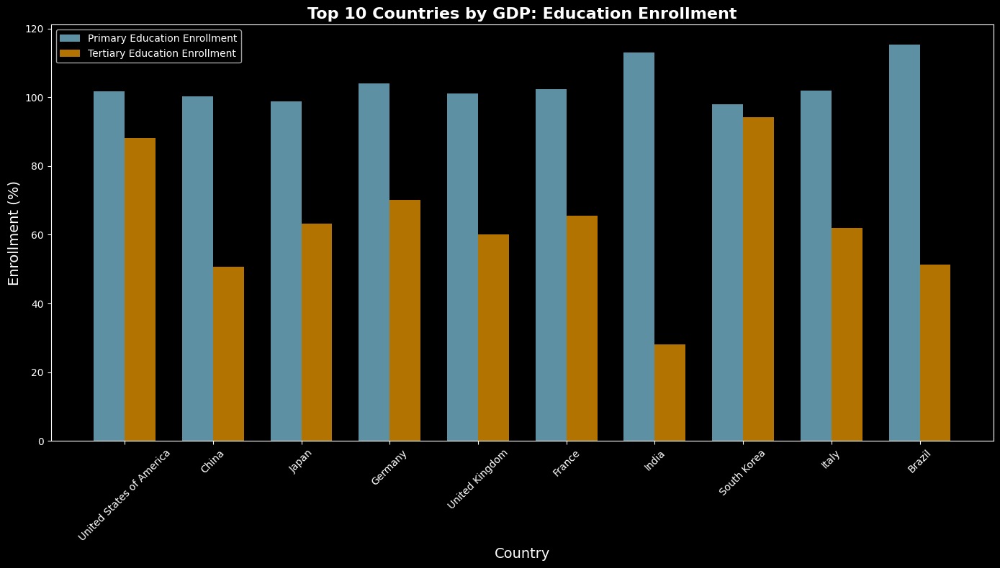

In [286]:
# Create a copy of the data for processing
education_data = final_df[['NAME', 
                         'Gross primary education enrollment (%)', 
                         'Gross tertiary education enrollment (%)', 
                         'GDP', 
                         'Population: Labor force participation (%)', 
                         'Life expectancy']].copy()

# Step 1: Remove % signs and convert to numeric
percent_cols = [ 
                'Gross tertiary education enrollment (%)', 
                'Population: Labor force participation (%)']

for col in percent_cols:
    education_data[col] = education_data[col].str.replace('%', '', regex=False)
    education_data[col] = pd.to_numeric(education_data[col], errors='coerce')

# Step 3: Ensure life expectancy is numeric
education_data['Life expectancy'] = pd.to_numeric(education_data['Life expectancy'], errors='coerce')

# Drop rows with missing values in relevant columns
education_data_cleaned = education_data.dropna()

# Check cleaned data
education_data_cleaned.head()

# Scatter Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(data=education_data_cleaned, 
                x='Gross tertiary education enrollment (%)', 
                y='GDP', 
                hue='Life expectancy', 
                size='Population: Labor force participation (%)', 
                sizes=(50, 300), 
                palette='coolwarm')

plt.title('Tertiary Education Enrollment vs GDP', fontsize=16, weight='bold')
plt.xlabel('Gross Tertiary Education Enrollment (%)', fontsize=14)
plt.ylabel('GDP (in billion USD)', fontsize=14)
plt.legend(title='Life Expectancy', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Bar Plot
top_countries = education_data_cleaned.sort_values(by='GDP', ascending=False).head(10)

plt.figure(figsize=(14, 8))
bar_width = 0.35
index = range(len(top_countries))

plt.bar(index, top_countries['Gross primary education enrollment (%)'], 
        bar_width, label='Primary Education Enrollment', color='skyblue', alpha=0.7)
plt.bar([i + bar_width for i in index], top_countries['Gross tertiary education enrollment (%)'], 
        bar_width, label='Tertiary Education Enrollment', color='orange', alpha=0.7)

plt.xticks([i + bar_width / 2 for i in index], top_countries['NAME'], rotation=45)
plt.title('Top 10 Countries by GDP: Education Enrollment', fontsize=16, weight='bold')
plt.xlabel('Country', fontsize=14)
plt.ylabel('Enrollment (%)', fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()